In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def f(x):
    return 3*x**2 - 4*x + 5

In [3]:
f(3.0)

20.0

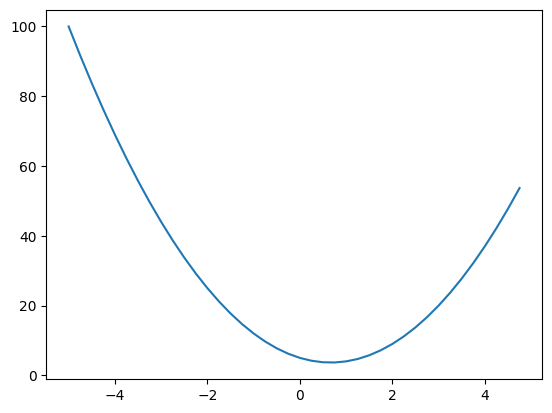

In [6]:
xs = np.arange(-5, 5, 0.25)
ys = f(xs)
plt.plot(xs, ys)

In [17]:
h = 0.00001  
x = 2/3
f(x), f(x + h), f(x + h) - f(x), (f(x + h) - f(x))/h

(3.666666666666667,
 3.666666666966667,
 3.000000248221113e-10,
 3.0000002482211127e-05)

In [19]:
h = 0.0001

a = 2.0
b = -3.0
c = 10.0
d1 = a*b + c
a += h
d2 = a*b + c
print("slope", (d2 - d1)/h)

slope -3.000000000010772


In [98]:
import math

In [276]:
class Value:
    def __init__(self, data, _children=(), _op='', label=''):
        self.data = data
        self.grad = 0.0
        self._prev = set(_children)
        self._op = _op
        self.label = label

    def __repr__(self):
        return f"Value(label={self.label}, data={self.data})"

    def __add__(self, other):
        other = other if isinstance(other, Value) else Value(other)
        out = Value(self.data + other.data, (self, other), '+')
        return out

    def __sub__(self, other):
        return self + (-other)

    def __mul__(self, other):
        other = other if isinstance(other, Value) else Value(other)
        out = Value(self.data*other.data, (self, other), '*')
        self.comp1 = self
        self.comp2 = other
        return out

    def __rmul__(self, other):
        return self * other

    def __pow__(self, other):
        assert isinstance(other, (int, float))
        out = Value(self.data**other, (self, other), f"**{other}")
        return out

    def __truediv__(self, other):
        return self * other**-1

    def tanh(self):
        t = (math.exp(2*self.data) - 1)/(math.exp(2*self.data) + 1)
        out = Value(t, (self, ), 'tanh')
        return out

    def exp(self):
        out = Value(math.exp(self.data), (self, ), 'exp')
        return out

    def backward(self):
        if self._op == '+':
            c1, c2 = self._prev
            c1.grad += self.grad
            c2.grad += self.grad

        elif self._op == '*':
            c1, c2 = self._prev
            c1.grad += self.grad * c2.data
            c2.grad += self.grad * c1.data

        elif self._op == 'tanh':
            c1, = self._prev
            c1.grad += self.grad * (1 - (self.data)**2)

        elif self._op == 'exp':
            c1, = self._prev
            c1.grad += self.grad * self.data

        elif self._op[:2] == '**':
            for child in self._prev:
                if isinstance(child, Value): 
                    c1 = child
                else:
                    power = child
            c1.grad += self.grad * (power * (c1.data)**(power - 1))

    def backprop(self):
        topo = []
        visited = set()
        def build_topo(v):
            if v not in visited and isinstance(v, Value):
                visited.add(v)
                for child in v._prev:
                   build_topo(child)
                topo.append(v)
        build_topo(self)

        self.grad = 1.0
        for node in reversed(topo):
            node.backward()
            

In [222]:
a = Value(1.0)
b = a.exp()
c = b + 1
e = b - 1
d = c * e
d.grad = 1
d.backprop()

self.grad: 5.43656365691809, self.data: 2.718281828459045


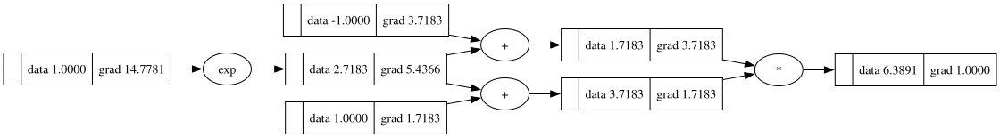

In [223]:
draw_dot(d)

In [146]:
a = Value(2.0, label='a')
b = Value(-3.0, label='b')
c = Value(10.0, label='c')
e = a*b; e.label = 'e'
d = e + c; d.label = 'd'
f = Value(-2.0, label='f')
L = d*f; L.label = 'L'
L

Value(label=L, data=-8.0)

In [147]:
s = set((1, ))
c1 = s
c1

Value(label=, data=4.0)

In [85]:
d._op

'+'

In [86]:
pip install graphviz -q


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.0.6_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [158]:
from graphviz import Digraph

def trace(root):
    nodes, edges = set(), set()
    def build(v):
        if v not in nodes and isinstance(v, Value):
            nodes.add(v)
            for child in v._prev:
                edges.add((child, v))
                build(child)
    build(root)
    return nodes, edges

def draw_dot(root):
    dot = Digraph(format='svg', graph_attr={'rankdir': 'LR'})

    nodes, edges = trace(root)
    for n in nodes:
        uid = str(id(n))
        dot.node(name=uid, label = "{ %s | data %.4f | grad %.4f }" % (n.label, n.data, n.grad), shape='record')
        if n._op:
            dot.node(name = uid + n._op, label = n._op)
            dot.edge(uid + n._op, uid)

    for n1, n2 in edges:
        dot.edge(str(id(n1)), str(id(n2)) + n2._op)

    return dot

In [88]:
L.grad = 1.0

In [90]:
L.backprop()

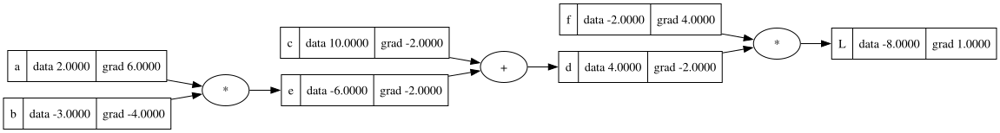

In [91]:
draw_dot(L)

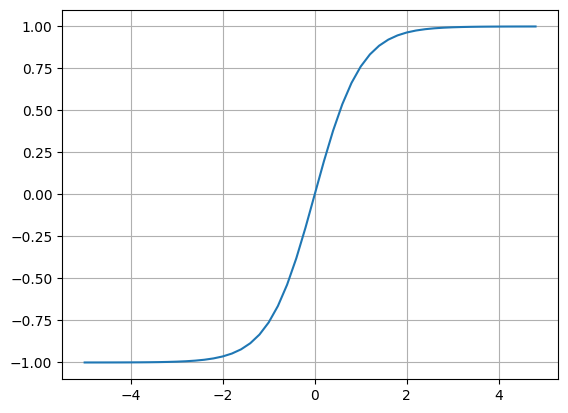

In [92]:
xs = np.arange(-5, 5, 0.2)
ys = np.tanh(xs)
plt.plot(xs, ys)
plt.grid()

In [227]:
x1 = Value(2.0, label='x1')
x2 = Value(0.0, label='x2')
w1 = Value(-3.0, label='w1')
w2 = Value(1.0, label='w2')
b = Value(6.8813735870195432, label='b')

x1w1 = x1*w1; x1w1.label = 'x1*w1'
x2w2 = x2*w2; x2w2.label = 'x2*w2'
x1w1x2w2 = x1w1 + x2w2; x1w1x2w2.label = 'x1*w1 + x2*w2'
n = x1w1x2w2 + b; n.label = 'n'
e = (2*n).exp()
print(e)

o = (e - 1)/(e + 1); o.label = 'o'; o.grad = 1
o.backprop()

Value(label=, data=5.828427124746192)
c1: Value(label=, data=6.828427124746192), power: -1
self.grad: 0.04289321881345247, self.data: 5.828427124746192


In [228]:
e.data

5.828427124746192

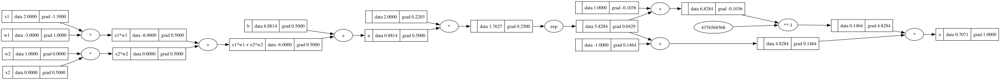

In [229]:
draw_dot(o)

In [232]:
import random

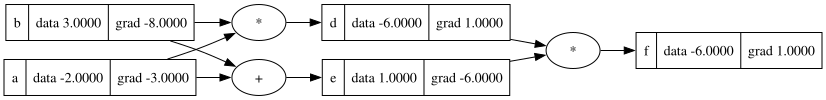

In [179]:
a = Value(-2.0, label='a')
b = Value(3.0, label='b')
d = a * b; d.label = 'd'
e = a + b; e.label = 'e'
f = d * e; f.label = 'f'; f.grad = 1
f.backprop()

draw_dot(f)


In [526]:
class Neuron:
    
    def __init__(self, nin):
        self.w = [Value(random.uniform(-1, 1)) for _ in range(nin)]
        self.b = Value(random.uniform(-1, 1))

    def __call__(self, x):
        act = sum([wi*xi for wi, xi in zip(self.w, x)], start=self.b)
        out = act.tanh()
        return out 

    def parameters(self):
        return self.w + [self.b]

class Layer:

    def __init__(self, nin, nout):
        self.neurons = [Neuron(nin) for _ in range(nout)]

    def __call__(self, x):
        outs = [n(x) for n in self.neurons]
        return outs[0] if len(outs) == 1 else outs

    def parameters(self):
        return [p for neuron in self.neurons for p in neuron.parameters()]

class MLP:
    def __init__(self, nin, nouts):
        sz = [nin] + nouts
        self.layers = [Layer(sz[i], sz[i + 1]) for i in range(len(nouts))]

    def __call__(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

    def parameters(self):
        return [p for layer in self.layers for p in layer.parameters()]

In [540]:

n = MLP(1, [2, 2, 2, 2, 2, 2, 2, 2, 1])

In [541]:
def f_to_c(f):
    return (f - 32)*5/9

In [547]:
xs = np.arange(0, 120, 10)
ys = f_to_c(xs)
xs = xs.tolist()
ys = ys.tolist()

In [548]:
# xs = [
#     [2.0, 3.0, -1.0],
#     [3.0, -1.0, 0.5],
#     [0.5, 1.0, 1.0],
#     [1.0, 1.0, -1.0],
# ]
# ys = [1.0, -1.0, -1.0, 1.0]

In [549]:
xs2 = xs.copy()
xs = []
for x in xs2:
    xs += [[x]]
xs, "\n", ys

([[0], [10], [20], [30], [40], [50], [60], [70], [80], [90], [100], [110]],
 '\n',
 [-17.77777777777778,
  -12.222222222222221,
  -6.666666666666667,
  -1.1111111111111112,
  4.444444444444445,
  10.0,
  15.555555555555555,
  21.11111111111111,
  26.666666666666668,
  32.22222222222222,
  37.77777777777778,
  43.333333333333336])

In [567]:
for k in range(10000):
    ypreds = [n(x) for x in xs]
    loss = sum([(yout - ygt)**2 for ygt, yout in zip(ys, ypreds)], start = Value(0.0))

    print(f"k: {k}, loss: {loss}")
    for param in n.parameters():
        param.grad = 0

    loss.backprop()
    
    for param in n.parameters():
        lr = 5
        param.data -= lr * param.grad
        # print(param.grad)

k: 0, loss: Value(label=, data=6078.172839507821)
k: 1, loss: Value(label=, data=6078.172839507821)
k: 2, loss: Value(label=, data=6078.172839507821)
k: 3, loss: Value(label=, data=6078.172839507821)
k: 4, loss: Value(label=, data=6078.172839507821)
k: 5, loss: Value(label=, data=6078.172839507821)
k: 6, loss: Value(label=, data=6078.172839507821)
k: 7, loss: Value(label=, data=6078.172839507821)
k: 8, loss: Value(label=, data=6078.172839507821)
k: 9, loss: Value(label=, data=6078.172839507821)
k: 10, loss: Value(label=, data=6078.172839507821)
k: 11, loss: Value(label=, data=6078.172839507821)
k: 12, loss: Value(label=, data=6078.172839507821)
k: 13, loss: Value(label=, data=6078.172839507821)
k: 14, loss: Value(label=, data=6078.172839507821)
k: 15, loss: Value(label=, data=6078.172839507821)
k: 16, loss: Value(label=, data=6078.172839507821)
k: 17, loss: Value(label=, data=6078.172839507821)
k: 18, loss: Value(label=, data=6078.172839507821)
k: 19, loss: Value(label=, data=6078.1728

In [522]:
draw_dot(loss)

AttributeError: 'Value' object has no attribute 'parameters'